Multiplexed smFISH on mouse cortex

# Imports

In [465]:
import loompy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pickle
from collections import Counter
import scipy
from mpl_toolkits.axes_grid1 import make_axes_locatable
import networkx 
from networkx.algorithms.components.connected import connected_components
import itertools

plt.rcParams.update({'figure.max_open_warning': 150})

%matplotlib notebook

# Import Data

## smFISH

In [6]:
file_name = '/home/lars/storage/Documents/Cortex_FISH/CountsV1-1.loom'
ds = loompy.connect(file_name)

#Cell size in dictionary. convert pixels to square um (pixel size = 0.065um)
cell_size = dict(zip(ds.CellID, (np.sqrt(ds.CellArea)*0.065)**2))

In [9]:
#Open object properties
obj_prop = pickle.load(open("ObjProp_dict.pkl", 'rb'))

#Load cell ID and XY coordinates into a list
coord_list = []
for i in obj_prop:
    coord_list.append([i, obj_prop[i]['obj_centroid'][0], obj_prop[i]['obj_centroid'][1]])
    
#Place cell ID and X and Y coordinates into dataframe
coord_df = pd.DataFrame(coord_list, columns=['Cell_ID', 'X', 'Y']).set_index('Cell_ID').T
coord_df = coord_df.loc[:,df_fish.columns]

In [905]:
def loompy2data(filename, cutoff_low, cutoff_high, molecules_low):
    """
    Loom file to Panda's dataframe. Perform size and count selection on cells
    Input:
    `filename`(str): Name and path tot the Loom file
    `cutoff_low`(flt): Minimal cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `cutoff_high`(flt): Max cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `molecules_low`(int): Minimal number of molecules
    Returns:
    Panda's dataframe with cells that passed the criteria. df has cell label as column name. 
    Some gene names are corrected
    Metadata is discarded. 
    
    """
    #Read loom file and import to Pandas df
    ds = loompy.connect(filename)
    df=pd.DataFrame(data=ds[:,:], columns=ds.col_attrs['CellID'], index=ds.row_attrs['genes']).astype(int)
    
    #Filter cell size
    for i, j in enumerate(ds.col_attrs['CellID']):
        if ds.col_attrs['CellArea'][i] < cutoff_low or ds.col_attrs['CellArea'][i] > cutoff_high:
            del df[j]
    
    #Filter total molecule count
    for i, j in enumerate(ds.col_attrs['CellID']):
        try: #not all 'CellID' are still present
            if df[j].sum() < molecules_low:
                del df[j]
        except Exception:
            pass
        
    #Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
    df= df.rename({'Hybridization11_Tmem6': 'Hybridization11_Tmem2', 'Hybridization12_Kcnip': 'Hybridization12_Kcnip2'})
        
    #Filter bad hybridiztion4 (out of focus imaging) and repeat Tbr1
    bad_data = ['Hybridization4_Cnr1', 'Hybridization4_Plp1', 'Hybridization4_Vtn', 'Hybridization11_Tbr1',
                'Hybridization9_Lum', 'Hybridization5_Klk6']
    for i in bad_data:
        df.drop(i, inplace=True)
    
    
    print('Selected cells with  {}>size<{} and a minimum molecule count of {} molecules'.format(cutoff_low, cutoff_high, molecules_low))
    print('Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2')
    return df

    
df_fish = loompy2data(file_name, 2000, 60000, 20)

gene_sort_fish = ['Hybridization2_Gad2', 'Hybridization12_Slc32a1', 'Hybridization10_Crhbp', 'Hybridization12_Kcnip2', 'Hybridization13_Cnr1', 'Hybridization6_Vip', 'Hybridization5_Cpne5', 'Hybridization8_Pthlh',  'Hybridization10_Crh', 
'Hybridization1_Tbr1', 'Hybridization9_Lamp5', 'Hybridization7_Rorb', 'Hybridization11_Syt6',
'Hybridization1_Aldoc', 'Hybridization2_Gfap', 'Hybridization8_Serpinf1', 'Hybridization3_Mfge8',
 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization8_Pdgfra', 'Hybridization6_Bmp4','Hybridization6_Itpr2',
                  'Hybridization11_Tmem2', 'Hybridization7_Ctps','Hybridization9_Anln',
 'Hybridization3_Mrc1','Hybridization3_Hexb', 
 'Hybridization13_Ttr',
 'Hybridization1_Foxj1',
 'Hybridization12_Vtn',
 'Hybridization2_Flt1',
 'Hybridization10_Apln',
 'Hybridization5_Acta2'
 ]

gene_sort = ['Gad2', 'Slc32a1', 'Crhbp', 'Kcnip2', 'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh',             
             'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 
             'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 
             'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem2',  'Ctps',  'Anln',   
             'Mrc1', 'Hexb', 
             'Ttr', 
             'Foxj1', 
             'Vtn', 'Flt1', 'Apln', 'Acta2'] 

df_fish = df_fish.loc[gene_sort_fish]


#Exclude the cells in the bleached area
coord_df = coord_df.loc[:, coord_df.loc['X'] < 25000]
#include_cells = coord_df.loc[:, coord_df.loc['X'] < 25000].columns.tolist()
df_fish = df_fish.loc[:, coord_df.columns]
print('Excluded cells from the bleached area')

print('\nFinal shape: {} genes, {} cells'.format(df_fish.shape[0], df_fish.shape[1]))

Selected cells with  2000>size<60000 and a minimum molecule count of 20 molecules
Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
Excluded cells from the bleached area

Final shape: 33 genes, 5208 cells


In [907]:
# normalize data by total number of molecules per cell and per gene.
df_fish_totmol = df_fish.divide(df_fish.sum(axis=1), axis=0) * df_fish.shape[0] #Corrected for total molecules per gene
df_fish_totmol = df_fish_totmol.divide(df_fish_totmol.sum(axis=0), axis=1) * df_fish.shape[1] #Corrected for the total per cell
df_fish_totmol

,1124,2325,2400,241,6248,5992,275,2573,330,1149,...,1217,2808,5162,532,3607,3251,2757,1228,1234,4653
Hybridization2_Gad2,53.784267,116.093907,59.047534,70.706421,548.995818,76.153191,134.570315,15.623643,32.582296,112.453076,...,109.521545,0.000000,44.268444,117.853948,89.666315,33.159412,40.690287,51.707916,167.089203,186.001151
Hybridization12_Slc32a1,42.570987,80.403683,109.052848,78.351146,514.760089,0.000000,53.257127,0.000000,90.262674,0.000000,...,0.000000,27.505346,0.000000,54.415095,27.600269,0.000000,225.448452,0.000000,0.000000,0.000000
Hybridization10_Crhbp,83.870682,0.000000,107.424533,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,153.438488,...,0.000000,54.189303,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Hybridization12_Kcnip2,5.317842,502.189559,681.128025,137.023520,35.073989,158.120287,266.108936,151.386994,78.927431,0.000000,...,0.000000,20.615321,382.985657,312.679175,441.311274,0.000000,28.162356,0.000000,0.000000,257.468358
Hybridization13_Cnr1,19.051987,71.966849,97.609831,490.907807,1172.807572,566.490216,286.012842,271.183581,201.978319,69.709891,...,0.000000,98.476737,164.652593,146.115805,617.603682,41.111174,151.343952,0.000000,0.000000,251.569075
Hybridization6_Vip,289.991224,84.262381,114.286464,164.222677,735.633035,221.091676,167.439058,90.718650,47.297260,108.826428,...,0.000000,576.507403,0.000000,627.292162,57.849698,240.675078,413.469129,300.241912,161.700522,49.091606
Hybridization5_Cpne5,0.000000,489.380594,82.969377,59.610967,35.603525,0.000000,162.075937,592.737115,137.346946,0.000000,...,0.000000,0.000000,279.912850,0.000000,419.975668,0.000000,0.000000,0.000000,0.000000,1140.460497
Hybridization8_Pthlh,152.647395,0.000000,0.000000,0.000000,671.193674,0.000000,190.964841,155.197415,0.000000,0.000000,...,0.000000,98.626312,0.000000,0.000000,98.966680,164.694469,0.000000,0.000000,0.000000,0.000000
Hybridization10_Crh,111.760355,0.000000,286.293225,0.000000,184.279701,0.000000,838.886187,113.627345,0.000000,136.307783,...,0.000000,72.208973,160.977371,142.854344,72.458173,120.580586,0.000000,0.000000,405.067778,0.000000
Hybridization1_Tbr1,81.142869,259.353380,447.701277,137.854163,48.028996,371.183912,218.639716,304.609419,66.171578,22.838161,...,88.971181,96.788028,1024.917509,319.133704,210.431113,107.749833,82.638144,0.000000,211.146411,68.681970


## Single Cell

# Comparison smFISH & Single Cell

## Counts

In [ ]:
# also compare the genes to see where the difference is coming from. 

## tSNE comparison

# tSNE

In [193]:
def scatter_tSNE(tSNE_data):
    
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(tSNE_data[:,0], tSNE_data[:,1], lw=0, s=40, alpha = 0.1, c = 'blue')
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('on')
    ax.axis('tight')
    
    return f, ax, sc

<IPython.core.display.Javascript object>


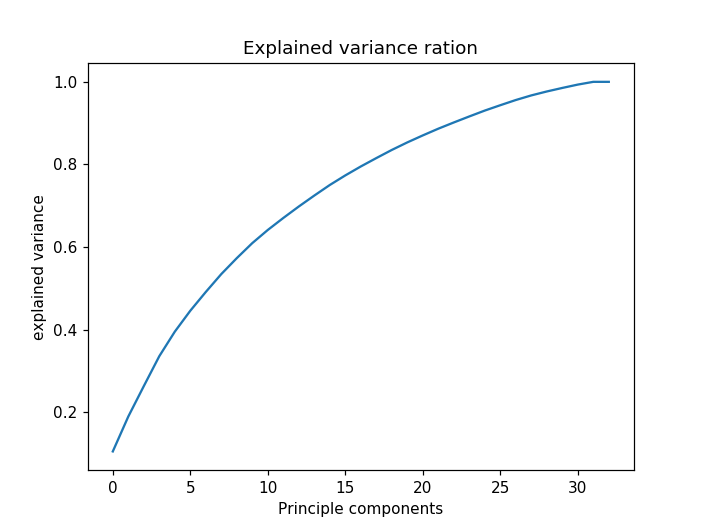

In [908]:
pca = PCA()
pc = pca.fit_transform(df_fish_totmol.T)

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ration')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

<IPython.core.display.Javascript object>


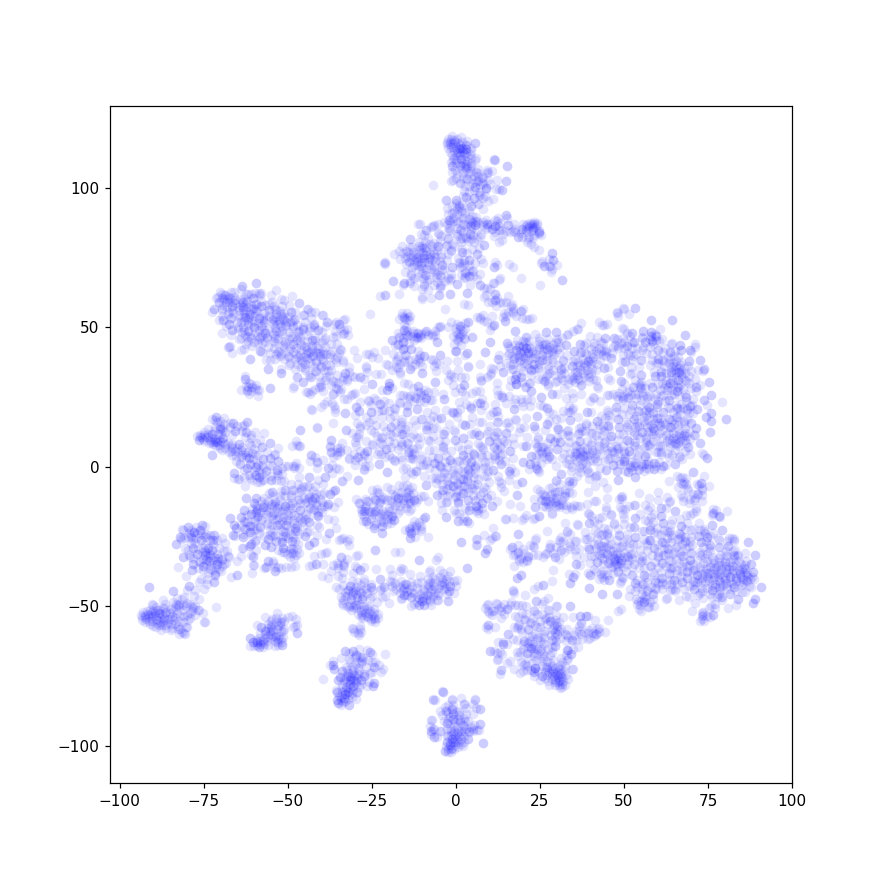

(<matplotlib.figure.Figure at 0x7f09295edda0>,
 <matplotlib.collections.PathCollection at 0x7f0934c14400>)

In [796]:
#model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
    #Transpose the data to work on the cells
#tSNE_points = model.fit_transform(pc[:,:33])
scatter_tSNE(tSNE_points)
#pickle.dump(tSNE_points, open( "tSNE_points_df_tot_mol_5028cells_p50_ea15.p", "wb" ))

<IPython.core.display.Javascript object>


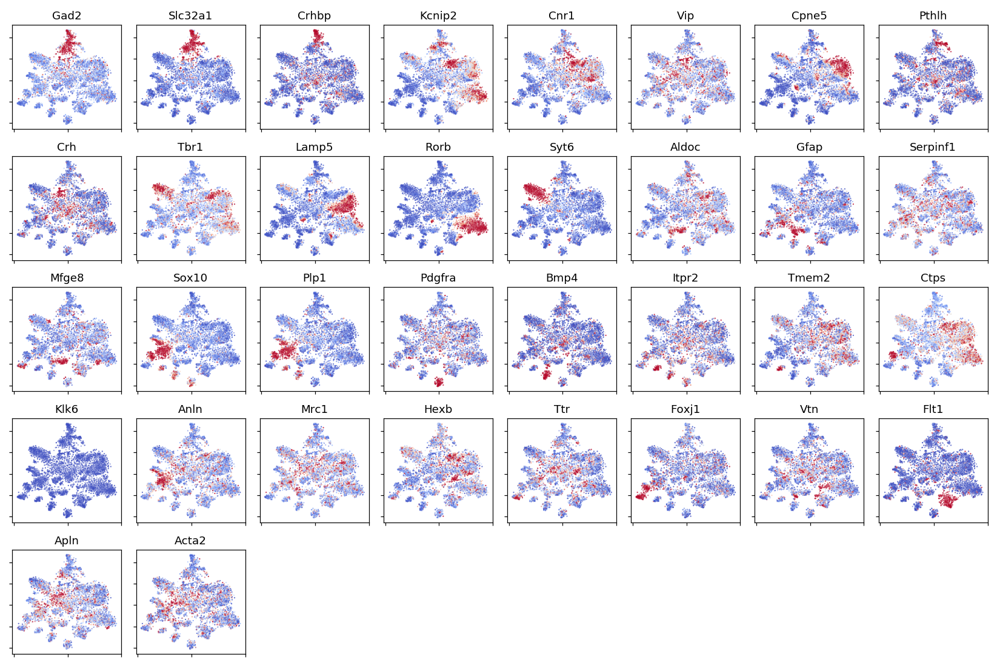

/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/matplotlib/colors.py:496: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


In [797]:
#Expression plot on tSNE points
plt.figure(figsize=(15,10))
gs = plt.GridSpec(5,8)

for i, gene in enumerate(gene_sort_fish):
    plt.subplot(gs[i])
    filt = df_fish.index == gene
    levels = df_fish_totmol.loc[filt,:].values.flat[:]
    levels = np.clip(levels, np.percentile(levels, 10), np.percentile(levels,90))
    plt.scatter(tSNE_points[:,0], tSNE_points[:,1],color=plt.cm.coolwarm(levels/max(levels)), lw=0, alpha=.5,s=2)
    for label in plt.gca().axes.get_xticklabels():
        label.set_visible(False)
    for label in plt.gca().axes.get_yticklabels():
        label.set_visible(False)
    plt.title(gene.split('_')[1])
plt.tight_layout()

# Clustering

In [1008]:

    


def iterative_clustering(df, expression_threshold, alpha, min_clust_size, dataset_fraction = 0.1, 
                         allow_level_difference=False, max_cycles = 50, post_merge=False, post_merge_r=0.90):
    
    def cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction, allow_level_difference=False):
        """
        Check if the clusters pass the criteria

        """
        evaluation = [0,0]

        #Investigate if there are genes enriched in a cluster
        enriched_df1 = df1[df1.mean(axis=1) > expression_threshold].index.tolist()
        enriched_df2 = df2[df2.mean(axis=1) > expression_threshold].index.tolist()

        if df1.shape[1] > (dataset_fraction * df.shape[1]) or df2.shape[1] > (dataset_fraction * df.shape[1]):
            evaluation[0] = 3

        elif enriched_df1 == [] and enriched_df2 == []: #No enriched genes in both groups
            evaluation[0] = 0
        elif enriched_df1 == enriched_df2: #Same enriched genes for both groups, level difference
            if allow_level_difference == True:
                evaluation[0] = 1
            else:
                evaluation[0] = 0
        elif enriched_df1 != enriched_df2: #At least one gene differentialy enriched
            evaluation[0] = 2



        #Test if there is a significant difference in the enriched genes between the groups
        diff_expressed = {'df1':[], 
                          'df2':[], # THIS CAN BE REMOVED
                          'both':[]}
        for gene in [i for i in enriched_df1 if i in enriched_df2]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['both'].append([gene, test_p])
                evaluation[1] = 1
        for gene in [i for i in enriched_df1 if i not in enriched_df2]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['df1'].append([gene, test_p])
                evaluation[1] = 2
        for gene in [i for i in enriched_df2 if i not in enriched_df1]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['df2'].append([gene, test_p])
                evaluation[1] = 2
        return evaluation

    def re_cluster(dfs = []):
        """
        Evaluate a list of clusters (dataframes) by splitting them again and 
        evaluating the daughter clusters.
        Input:
        `dfs`(list): List of Pandas dataframes containing one cluster.

        """
        re_evaluation = []
        for d in dfs:
            split = AgglomerativeClustering(n_clusters=2).fit(d.T)
            split_labels = split.labels_ 
            df_daughter_1 = d.loc[:,split_labels == np.unique(split_labels)[0]]
            df_daughter_2 = d.loc[:,split_labels == np.unique(split_labels)[1]]
            re_evaluation.append(cluster_evaluation(df_daughter_1, df_daughter_2, expression_threshold, 
                                                    alpha, dataset_fraction,
                                                    allow_level_difference=allow_level_difference))
        return(re_evaluation)  
    
    def to_graph(l):
        """
        Make a graph of a list of lists
        From: https://stackoverflow.com/questions/4842613/merge-lists-that-share-common-elements

        """
        G = networkx.Graph()
        for part in l:
            # each sublist is a bunch of nodes
            G.add_nodes_from(part)
            # it also imlies a number of edges:
            G.add_edges_from(to_edges(part))
        return G

    def to_edges(l):
        """ 
        treat `l` as a Graph and returns it's edges 
        to_edges(['a','b','c','d']) -> [(a,b), (b,c),(c,d)]
        From: https://stackoverflow.com/questions/4842613/merge-lists-that-share-common-elements

        """
        it = iter(l)
        last = next(it)

        for current in it:
            yield last, current
            last = current  
            
    def mean_expression(df, labels):
        """
        Make dataframe with mean expression per label.

        """
        #Make df with count averages per cluster
        df_count_average = pd.DataFrame(index=df.index, columns=np.sort(np.unique(labels))) #np.unique(labels_a))
        for l in np.unique(labels):
            filt = labels == l
            mean = np.array(df.loc[:,filt].T.mean())
            #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
            if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
                df_count_average[l] = mean
        return df_count_average

    #=========================================================================
    finished_clusters = []
    label_ofset = 0
    finished = False

    #Make matrix for labels. First row all zeros
    label_matrix = pd.DataFrame(data= np.zeros((1, df.shape[1])), index = ['Level_0'], columns=df.columns, dtype='Int64')

    for cycle, x in enumerate(range(max_cycles)):

        previous_level = 'Level_{}'.format(cycle)
        current_level = 'Level_{}'.format(cycle + 1)

        if list(set(label_matrix.loc[previous_level]) - set(finished_clusters)) == []:
            print('\nNo difference between the last two label levels. Clustering completed.')
            finished = True
            break

        #Add row and copy labels
        label_matrix.loc[current_level] = label_matrix.loc[previous_level]

        #Loop through all labels that are not in finished_clusters
        for old_label in [i for i in np.unique(label_matrix.loc[current_level]) if i not in finished_clusters]:
            label_ofset += 2
            print('Clustering: {}, label: {}'.format(current_level, old_label))

            #Create dataframe to split
            filt = label_matrix.loc[current_level] == old_label
            df_to_split = df.loc[:,filt]

            #Cluster dataframe into two clusters
            split = AgglomerativeClustering(n_clusters=2).fit(df_to_split.T)
            split_labels = split.labels_ + label_ofset #Labels are 0 and 1, shift them with the clustering step
            unique_split_labels = np.unique(split_labels)

            #Check if all the clusters are larger than the min_clust_size
            if all(i > min_clust_size for i in list(Counter(split_labels).values())):

                #Make df1 & df2
                df1 = df_to_split.loc[:,split_labels == unique_split_labels[0]]
                df2 = df_to_split.loc[:,split_labels == unique_split_labels[1]]

                #Evaluate split
                evaluation = cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction)

                print('    Daughter clusters labels: {}, evaluation of split: {}'.format(unique_split_labels, evaluation))
                #List of the labels that are valid clusters (or will be in the next cycle)
                valid_labels = []

                #_____________________________________________________________________
                if evaluation[0] == 3:
                    print('    At least one of the daughter clusters is too large')
                    threshold = dataset_fraction * df.shape[1]
                    if df1.shape[1] > threshold and df2.shape[1] > threshold:
                        valid_labels.extend(unique_split_labels)
                    elif df1.shape[1] > threshold:
                        valid_labels.append(unique_split_labels[0])
                        re_evaluation = re_cluster([df2])
                        if re_evaluation[0][1] == 0:
                            finished_clusters.append(unique_split_labels[1])
                            valid_labels.append(unique_split_labels[1])
                        else: #Difference in daughters, continue clustering
                            valid_labels.append(unique_split_labels[1])
                    elif df2.shape[1] > threshold:
                        valid_labels.append(unique_split_labels[1])
                        re_evaluation = re_cluster([df1])
                        if re_evaluation[0][1] == 0:
                            finished_clusters.append(unique_split_labels[0])
                            valid_labels.append(unique_split_labels[0])
                        else: #Difference in daughters, continue clustering
                            valid_labels.append(unique_split_labels[0])


                #No enriched genes, NO expression difference
                elif evaluation[0] == 0:
                    print('    No enriched genes, No expression difference')
                    re_evaluation = re_cluster([df1, df2])
                    #No valid daughter clusters in the next cycle
                    if re_evaluation[0][1] == 0 and re_evaluation[1][1] == 0:
                        finished_clusters.append(old_label)
                        print('    Encountered a cluster without expression: {}{}'.format(current_level, old_label))
                    #Valid daughter clusters in the next cycle
                    else:
                        valid_labels.extend(unique_split_labels)

                #Different genes enriched, expression difference
                elif evaluation[0] == 2 and evaluation[1] == 2:
                    print('    Different enriched genes, expression difference')
                    re_evaluation = re_cluster([df1, df2])
                    #First cluster
                    if re_evaluation[0][1] == 0: #no difference in daughter clusters, current cluster finished
                        finished_clusters.append(unique_split_labels[0])
                        valid_labels.append(unique_split_labels[0])
                    else: #Difference in daughters, continue clustering
                        valid_labels.append(unique_split_labels[0])
                    #Second cluster
                    if re_evaluation[1][1] == 0: #no difference in daughter clusters, current cluster finished
                        finished_clusters.append(unique_split_labels[1])
                        valid_labels.append(unique_split_labels[1])
                    else: #Difference in daughters, continue clustering
                        valid_labels.append(unique_split_labels[1])    


                #Different genes enriched, NO expression difference
                elif evaluation[0] == 2 and evaluation[1] == 0:
                    print('    Encounterd a difference but no significant difference {} {}-->{}'.format(current_level, old_label, unique_split_labels))
                    re_evaluation = re_cluster([df1, df2])
                    if re_evaluation[0][1] == 0 and re_evaluation[1][1] == 0: #No valid daughter clusters
                        finished_clusters.append(old_label)
                    else:
                        valid_labels.extend(unique_split_labels)

                #Same or more enriched, expression level difference
                elif evaluation[0] > 0 and evaluation[1] == 1:
                    print('    Encountered a split with similar expressed genes')
                    if allow_level_difference == True:
                        valid_labels.extend(unique_split_labels)
                        finished_clusters.extend(unique_split_labels)
                    else:
                        finished_clusters.append(old_label)


                #Same enriched, NO expression difference
                elif evaluation[0] == 1 and evaluation[1] == 0:
                    print('    Same genes enriched but no expression idfference')
                    finished_clusters.append(old_label) #Not a valid split, current cluster finished  

                else:
                    print('ERROR, Split evaluation did not fit the criteria: {} in: {} {}'.format(evaluation, current_level, old_label))

                #_____________________________________________________________________

            else:
                finished_clusters.append(old_label)

            #Add labels to matrix
            final_split_labels = [old_label if i not in valid_labels else i for i in split_labels]
            for c, i in enumerate(filt):
                if i == True:
                    count_true = Counter(filt[:c])[True] #Count how many Trues already have been passed
                    label_matrix.loc[current_level][c] = final_split_labels[count_true] #Add the new labels to the label matrix
            print('Finished Clusters:  {}\n'.format(finished_clusters))
    
    if finished == False:
        print('Max number of cycles reached. Possibly there is more structure with more rounds of clustering.')
    print('\nClustering finished. Result {} clusters with labels: {}\n'.format(len(np.unique(label_matrix.iloc[-1])), np.unique(label_matrix.iloc[-1])))
    
    if post_merge == True:
        #Make mean expression dataframe with last level labels and cross correlate clusters
        mean_exp = mean_expression(df, label_matrix.iloc[-1])
        clust_correlation = mean_exp.corr(method='pearson').values
        clust_correlation = np.triu(clust_correlation, k=1)
        #Select clusters with rho > threshold and group similar clusters
        connected_clusters = np.where(clust_correlation > post_merge_r)
        connected_clusters = [list(i) for i in zip(connected_clusters[0], connected_clusters[1])]
        G = to_graph(connected_clusters)
        cluster_sets = connected_components(G)
    
            
        label_matrix.loc['Post_merge'] = label_matrix.iloc[-1]
        max_label = label_matrix.iloc[-1].max()
        print('Post merging clusters that have a pearson r > {}'.format(post_merge_r))
        for n, s in enumerate(cluster_sets):
            labels_to_merge = np.take(np.unique(label_matrix.iloc[-2]), list(s))
            eval_simularity = []
            
            for i in itertools.combinations(labels_to_merge, 2):
                filt = label_matrix.iloc[-2] == i[0]
                df_sim1 = df.loc[:, filt]
                filt = label_matrix.iloc[-2] == i[1]
                df_sim2 = df.loc[:, filt]
                eval_simularity.append(cluster_evaluation(df_sim1, df_sim2, expression_threshold, alpha, 
                                                          dataset_fraction, allow_level_difference=False)[1])  
                print(eval_simularity)
            if 2 not in eval_simularity:
                label_matrix.loc['Post_merge' , label_matrix.loc['Post_merge'].isin(labels_to_merge)] = max_label + n + 1
                print('Merged clusters {} into cluster {}'.format(labels_to_merge, max_label + n + 1))
            else:
                print('Did NOT merge clusters {}, there is an expression difference'.format(labels_to_merge))    
            
            
            
            
            
        print('\nMerging finished. Result {} clusters with labels: {}\n'.format(len(np.unique(label_matrix.iloc[-1])), 
                                                                                np.unique(label_matrix.iloc[-1])))
    return label_matrix




label_matrix = iterative_clustering(df_fish_totmol, 
                     expression_threshold = 400, 
                     alpha = 0.1e-20,
                     min_clust_size = 15, 
                     dataset_fraction = 0.05, 
                     allow_level_difference=False, 
                     max_cycles = 50,
                     post_merge = True,
                     post_merge_r = 0.865) #0.86

"""df_fish_totmol, 
                     expression_threshold = 550, 
                     alpha = 0.1e-20,
                     min_clust_size = 10, 
                     dataset_fraction = 0.1, 
                     allow_level_difference=False, 
                     max_cycles = 50)"""

Clustering: Level_1, label: 0
    Daughter clusters labels: [2 3], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  []

Clustering: Level_2, label: 2
    Daughter clusters labels: [4 5], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  []

Clustering: Level_2, label: 3
    Daughter clusters labels: [6 7], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  [7]

Clustering: Level_3, label: 4
    Daughter clusters labels: [8 9], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  [7]

Clustering: Level_3, label: 5
    Daughter clusters labels: [10 11], evaluation of split: [3, 1]
    At least one of the daughter clusters is too large
Finished Clusters:  [7, 11]

Clustering: Level_3, label: 6
    Daughter clusters labels: [12 13], evaluation of split: [3, 1]
    At least one of the 

Finished Clusters:  [7, 11, 13, 10, 21, 27, 17, 20, 35, 37, 25, 41, 43, 45, 47, 36, 51, 55, 50, 61, 62, 63, 54, 66, 67, 68, 69, 73, 75]

Clustering: Level_12, label: 74
    Daughter clusters labels: [78 79], evaluation of split: [2, 2]
    Different enriched genes, expression difference
Finished Clusters:  [7, 11, 13, 10, 21, 27, 17, 20, 35, 37, 25, 41, 43, 45, 47, 36, 51, 55, 50, 61, 62, 63, 54, 66, 67, 68, 69, 73, 75, 78, 79]

Clustering: Level_13, label: 76
    Daughter clusters labels: [80 81], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  [7, 11, 13, 10, 21, 27, 17, 20, 35, 37, 25, 41, 43, 45, 47, 36, 51, 55, 50, 61, 62, 63, 54, 66, 67, 68, 69, 73, 75, 78, 79, 81]

Clustering: Level_13, label: 77
    Daughter clusters labels: [82 83], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  [7, 11, 13, 10, 21, 27, 17, 20, 35, 37, 25, 41, 43, 45, 47, 36, 51, 55, 50, 61, 62, 63, 54

'df_fish_totmol, \n                     expression_threshold = 550, \n                     alpha = 0.1e-20,\n                     min_clust_size = 10, \n                     dataset_fraction = 0.1, \n                     allow_level_difference=False, \n                     max_cycles = 50)'

In [809]:
def mean_expression(df, labels):
    """
    Make dataframe with mean expression
    
    """
    #Make df with count averages per cluster
    df_count_average = pd.DataFrame(index=df.index, columns=np.sort(np.unique(labels))) #np.unique(labels_a))
    for l in np.unique(labels):
        filt = labels == l
        mean = np.array(df.loc[:,filt].T.mean())
        #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
        if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
            df_count_average[l] = mean
    return df_count_average

def heat_map(df, labels, sort=None, save=False, name=''):
    """
    Plot heat_map of a dataframe
    
    """
    #Find the name of the input df, for logging
    df_input_name =[x for x in globals() if globals()[x] is df][0]
    print('DF used for plot: {}'.format(df_input_name))
    
    if sort == None:
        optimal_order = np.unique(labels)    
    else:
        optimal_order = sort
    print('Order of clusters: {}'.format(optimal_order))
    
    #Sort the cells according to the optimal cluster order
    optimal_sort_cells = []
    for i in optimal_order:
        optimal_sort_cells.extend(label_cells[i])
    
    #Create a list of optimal sorted cell labels
    optimal_sort_labels = []
    for i in optimal_sort_cells:
        optimal_sort_labels.append(cell_labels[i])
    
    fig, axHM = plt.subplots(figsize=(14,6))
    
    df_full = df.copy() # _fish_log
    z = df_full.values
    z = z/np.percentile(z, 99, 1)[:,None]
    z = pd.DataFrame(z, index=df_full.index, columns=df_full.columns)
    z = z.loc[:,optimal_sort_cells].values
    print(z.shape)
    
    im = axHM.pcolor(z, cmap='viridis', vmax=1)

    plt.yticks(np.arange(0.5, len(df.index), 1), gene_sort, fontsize=8)
    plt.gca().invert_yaxis()
    plt.xlim(xmax=len(labels))
    print(len(labels))
    plt.title(df_input_name)

    divider = make_axes_locatable(axHM)
    axLabel = divider.append_axes("top", .3, pad=0, sharex=axHM)

    optimal_sort_labels = np.array(optimal_sort_labels)
    axLabel.pcolor(optimal_sort_labels[None,:]/max(optimal_sort_labels), cmap='jet')
        #Colors, see below:
    #axLabel.pcolor(label_colors_rgb) #label_colors_hex
    
    
    
    axLabel.set_xlim(xmax=len(labels))
    axLabel.axis('off')
    
    cax = fig.add_axes([.91, 0.13, 0.01, 0.22])
    colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
    colorbar.set_ticklabels(['0', 'max'])
    
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=300)
    
    
def gen_labels(df, model):
    """
    Generate cell labels from model.
    Input:
    `df`: Panda's dataframe that has been used for the clustering. (used to get
    the names of colums and rows)
    `model`(obj): Clustering object
    Returns (in this order):
    `cell_labels` = Dictionary coupling cellID with cluster label
    `label_cells` = Dictionary coupling cluster labels with cellID
    `cellID` = List of cellID in same order as labels
    `labels` = List of cluster labels in same order as cells
    `labels_a` = Same as "labels" but in numpy array
    
    """
    if str(type(model)).startswith("<class 'sklearn.cluster"):
        cell_labels = dict(zip(df.columns, model.labels_))
        label_cells = {}
        for l in np.unique(model.labels_):
            label_cells[l] = []
        for i, label in enumerate(model.labels_):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model.labels_)
        labels_a = model.labels_
    elif type(model) == np.ndarray:
        cell_labels = dict(zip(df.columns, model))
        label_cells = {}
        for l in np.unique(model):
            label_cells[l] = []
        for i, label in enumerate(model):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model)
        labels_a = model
    else:
        print('Error wrong input type')
    
    return cell_labels, label_cells, cellID, labels, labels_a


33
DF used for plot: df_fish_totmol
Order of clusters: [13 17 21 27 37 41 43 45 47 54 55 61 62 63 66 68 69 73 75 78 79 81 83 85 86
 87 88 89 90 91 92 93 94]


<IPython.core.display.Javascript object>


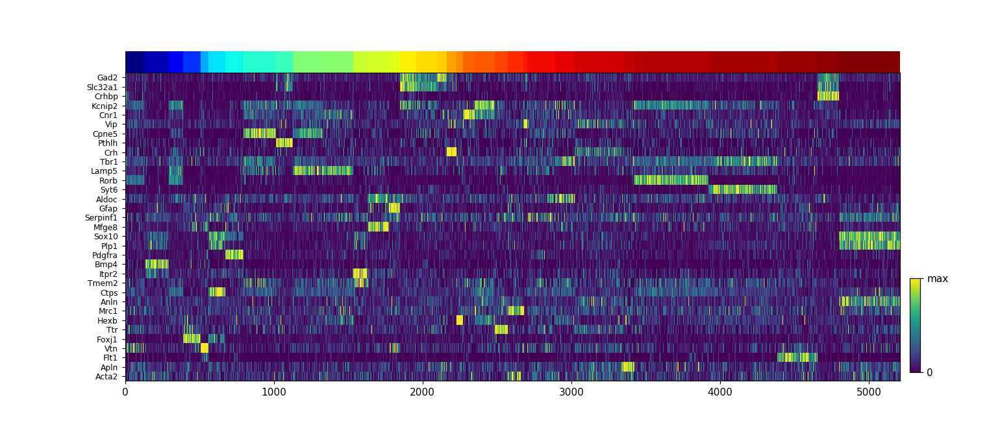

(33, 5208)
5208


In [1009]:
last_level = label_matrix.iloc[-1]

cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df_fish_totmol, np.array(last_level))
print(len(np.unique(labels_a)))
heat_map(df_fish_totmol, labels)

In [1048]:
pickle.dump(cell_labels,  open( "cell_labels_5208_totmol.p", "wb" ))

In [1014]:
def compare_merge(df, labels, l, expression_threshold):
    mean_df = mean_expression(df, labels)
    for i in l:
        print('{}\n{}'.format(i , mean_df.loc[mean_df.loc[:,i]>expression_threshold, i]))

        
    for i in itertools.combinations(l, 2):
        print('\nmerging: {}'.format(i))
        print('Correlation: {}'.format(mean_df.corr().loc[i[0], i[1]]))
        
        df1 = df.loc[:, labels == i[0]]
        df2 = df.loc[:, labels == i[1]]
        enriched_df1 = df1[df1.mean(axis=1) > expression_threshold].index.tolist()
        enriched_df2 = df2[df2.mean(axis=1) > expression_threshold].index.tolist()
        
        enriched = set(enriched_df1 + enriched_df2)
        for i in enriched:
            print('{} {}'.format(i, scipy.stats.mannwhitneyu(df1.loc[i], df2.loc[i], alternative='two-sided')[1]))


compare_merge(df_fish_totmol, labels_a, [13, 21], 300)
#compare_merge(df_fish_totmol, labels_a, [7,20,21], 300)

13
Hybridization7_Rorb    609.730079
Hybridization12_Vtn    303.845457
Name: 13, dtype: float64
21
Hybridization12_Kcnip2    367.041482
Hybridization9_Lamp5      592.130325
Hybridization7_Rorb       805.052501
Name: 21, dtype: float64

merging: (13, 21)
Correlation: 0.7126670253707578
Hybridization7_Rorb 1.2318164962511082e-09
Hybridization12_Kcnip2 2.7573133887522896e-13
Hybridization12_Vtn 5.101989310439969e-12
Hybridization9_Lamp5 4.521983895187586e-28


In [1017]:
cluster_names = {13: 'Pyramidal L4 2',
17: 'Oligodendrocyte COP',
21: 'Pyramidal interface L3-4',
27: 'Ependymal',
37: 'Pericytes',
41: 'Opigodendrocytes MF',
43: 'OPC',
45: 'Cpne5+',
47: 'Interneuron Kcnip Pthlh',
54: 'Pyramidal L2-3',
55: 'Pyramidal L2-3 L5',
61: 'Oligodendrocyte NF',
62: 'Astrocyte Mfge8',
63: 'Astrocyte Gfap',
66: 'Interneuron Kcnip2',
68: 'Interneuron Kcnip2, Syt6',
69: 'Interneuron Gad2 Slc32a1-',
73: 'Interneuron Cnr1 Vip Crh',
75: 'Microglia',
78: 'Interneuron Cnr1',
79: 'Hippocampal neuron',
81: 'Choroid plexus',
83: 'PVM VSM',
85: 'Interneuron Vip',
86: 'Interneuron Lamp5',
87: 'Pyramidal L5',
88: 'BQ',
89: 'Endothelial 1',
90: 'Pyramidal L4',
91: 'Pyramidal L6',
92: 'Endothelial',
93: 'Interneuron Crhbp',
94: 'Oligodendrocyte mature'}

In [1044]:
cluster_colors = {
    13: '#4facdc',
    17: '#5bc241',
    21: '#31609d',
    27: '#ffdf05',
    37: '#ccec19',
    41: '#508966',
    43: '#64c099',
    45: '#0e5d77',
    47: '#d5416a',
    54: '#62a8ba',
    55: '#396e87',
    61: '#66a44f',
    62: '#f69048',
    63: '#dc4501',
    66: '#983fd8',
    68: '#d0839e',
    69: '#592d95',
    73: '#a7506a',
    75: '#00c690',
    78: '#a16cda',
    79: '#06405e',
    81: '#026449',
    83: '#bc23b3',
    85: '#68396c',
    86: '#cf47ac',
    87: '#80a5da',
    88: '#6b6b6b',
    89: '#ef5454',
    90: '#41c6dd',
    91: '#538ee1',
    92: '#fb2828',
    93: '#bc89ca',
    94: '#2c5525'
}

<IPython.core.display.Javascript object>


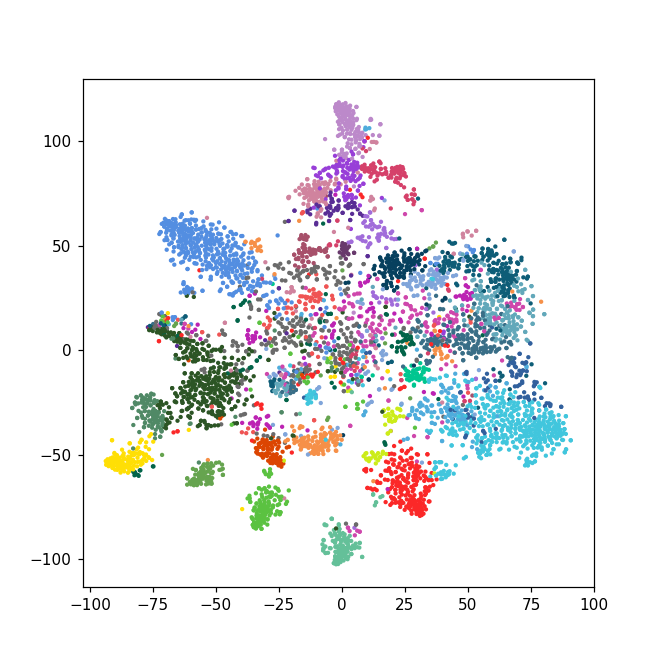

5208


In [1045]:
def plot_labels(df, labels_a, standalone=True):
    if standalone == True:
        plt.figure(figsize=(6, 6))
    points = np.zeros((len(df.columns),2))
    for i, n in enumerate(df.columns):
        points[i,:] = tSNE_points[df_fish.columns.get_loc(n),:]
    print(len(points))
    #plt.scatter(points[:,0], points[:,1],c=plt.cm.jet(labels_a/max(labels_a)), lw=0, alpha=1, s=7)
        #Color labels
    plt.scatter(points[:,0], points[:,1],c=[cluster_colors[i] for i in labels_a], lw=0, alpha=1, s=8)
    
plot_labels(df_fish_totmol, labels_a)

In [76]:
def plot_cells_pos_labels(labels_a):
    
    coord_df_sort = sort_df(coord_df.loc[:,cellID], labels_a, row_sort=False)
    color_labels_sort =plt.cm.jet(np.sort(labels_a)/max(np.sort(labels_a)))    
    plot_cell_pos(coord_df_sort, cell_ids=None, color=color_labels_sort, s=10, standalone=False, mode='tsne')
        #Color labels: See below, part 10
    #plot_cell_pos(coord_df_sort, cell_ids=None, color=label_colors_hex, s=10, standalone=False, mode='tsne')
    
plot_cells_pos_labels(labels_a)

NameError: name 'sort_df' is not defined

<IPython.core.display.Javascript object>


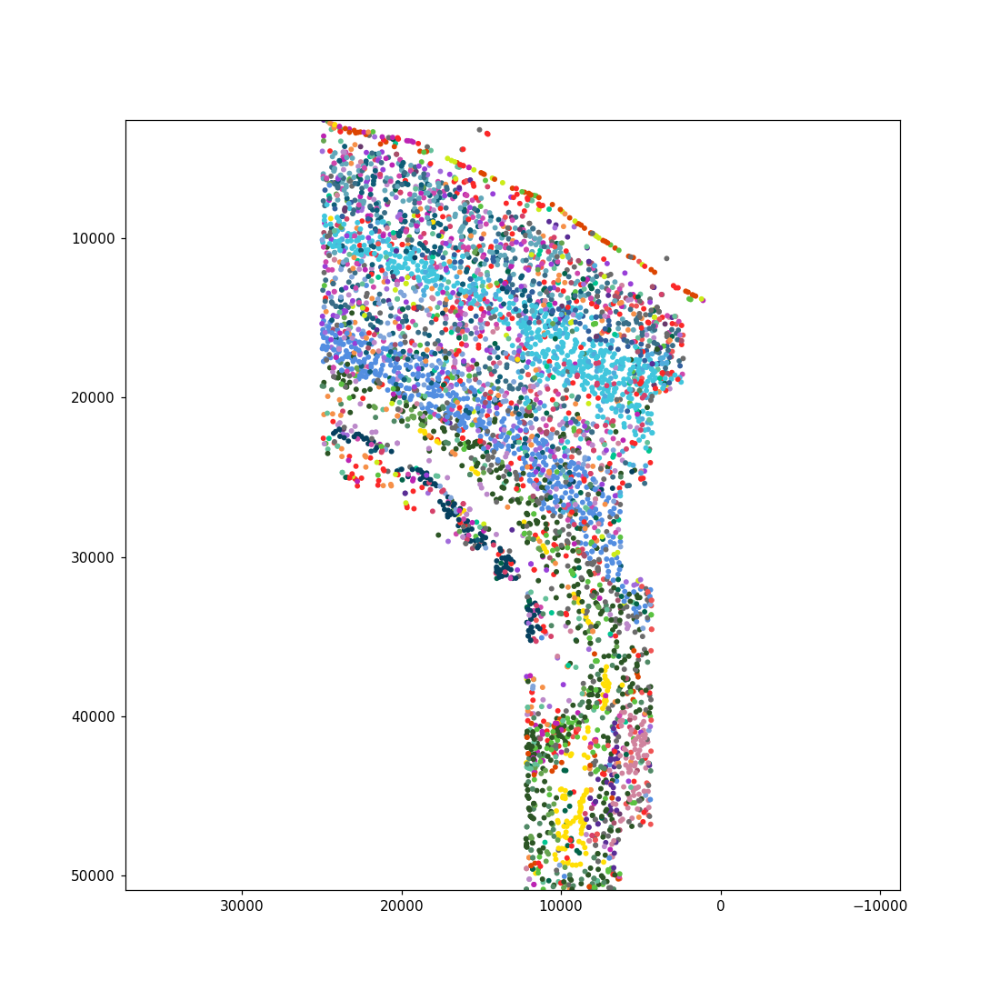

(50892.770878319228, 2602.5350161783608)

In [1046]:
plt.figure(figsize=(10,10))
color_labels_sort =[cluster_colors[i] for i in labels_a]
plt.scatter(coord_df.loc['X',:], coord_df.loc['Y',:], linewidths=0, c=color_labels_sort, s=15)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.gca().axis('equal')
plt.xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
plt.ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])

<IPython.core.display.Javascript object>


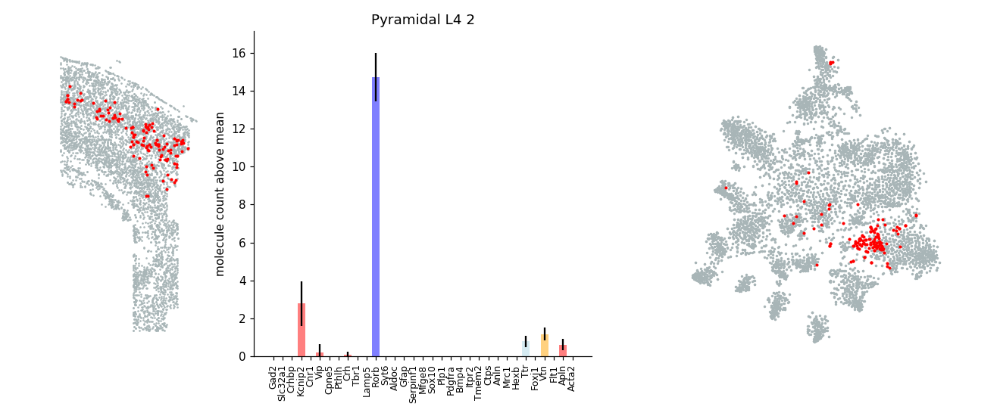

<IPython.core.display.Javascript object>


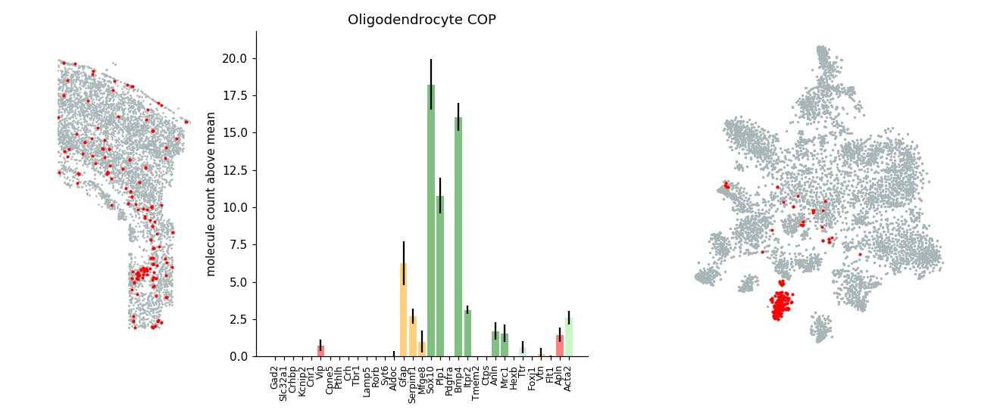

<IPython.core.display.Javascript object>


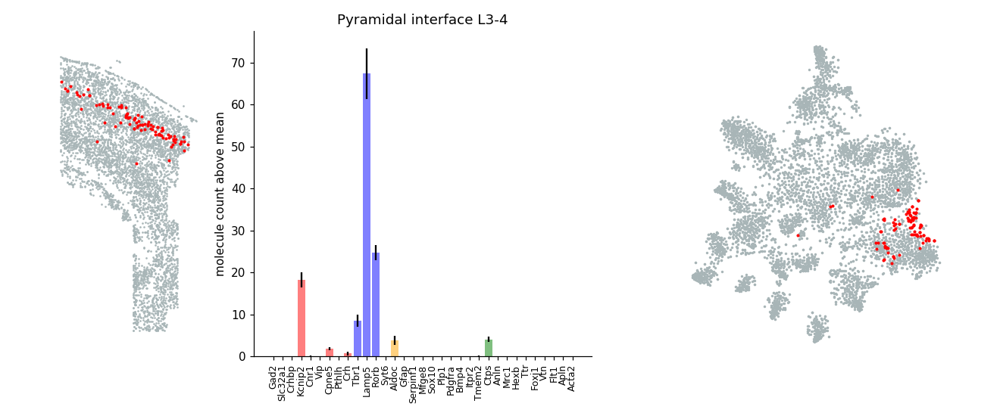

<IPython.core.display.Javascript object>


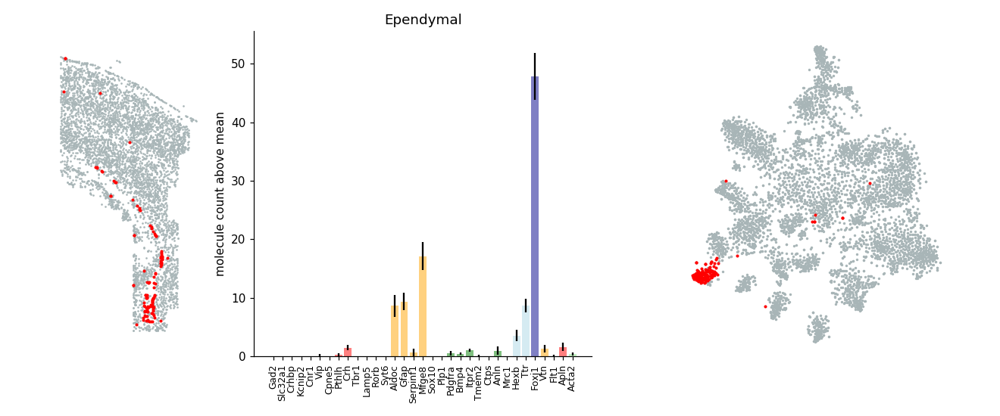

<IPython.core.display.Javascript object>


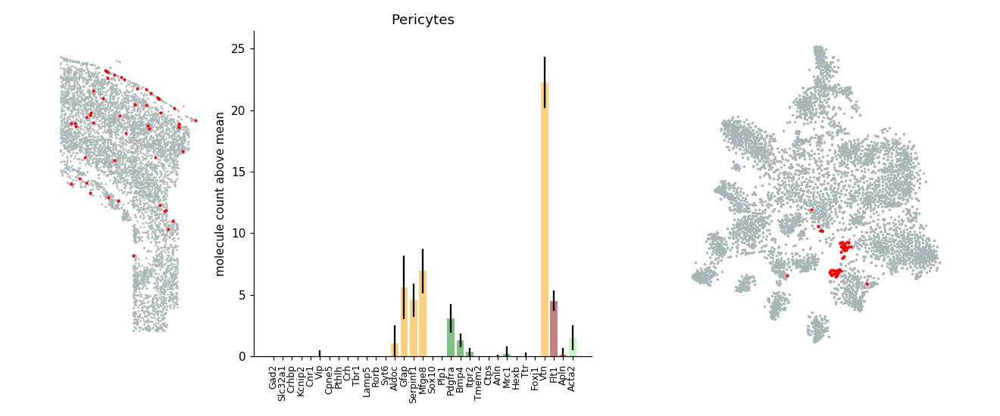

<IPython.core.display.Javascript object>


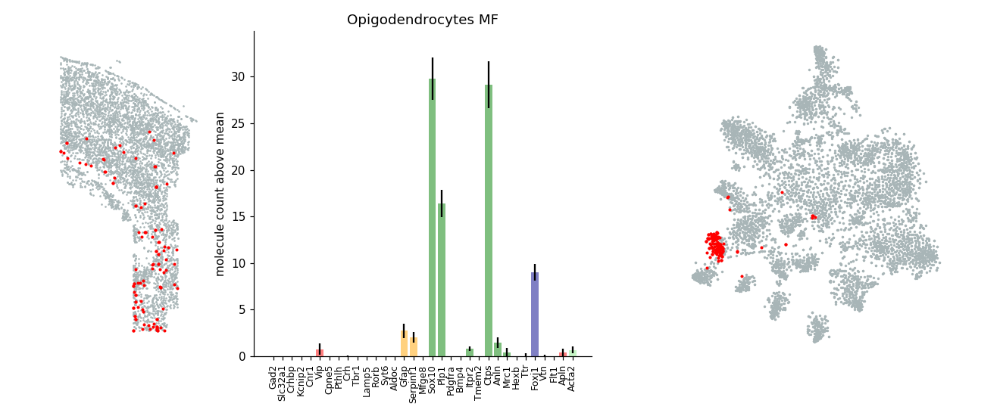

<IPython.core.display.Javascript object>


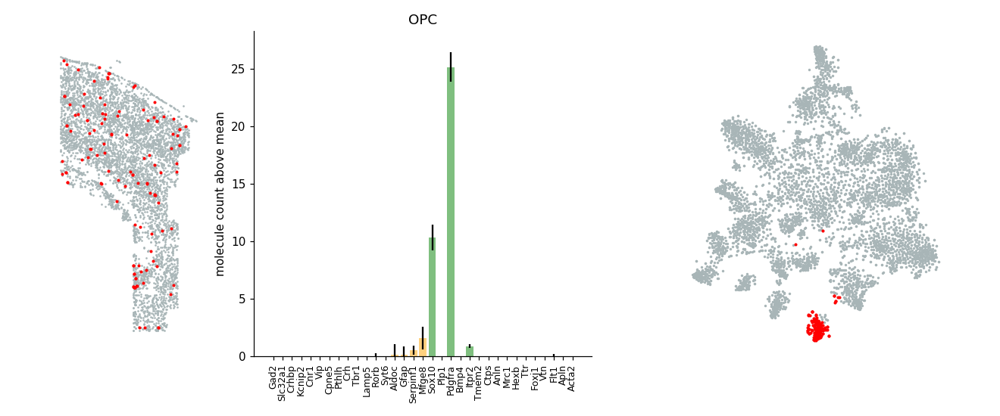

<IPython.core.display.Javascript object>


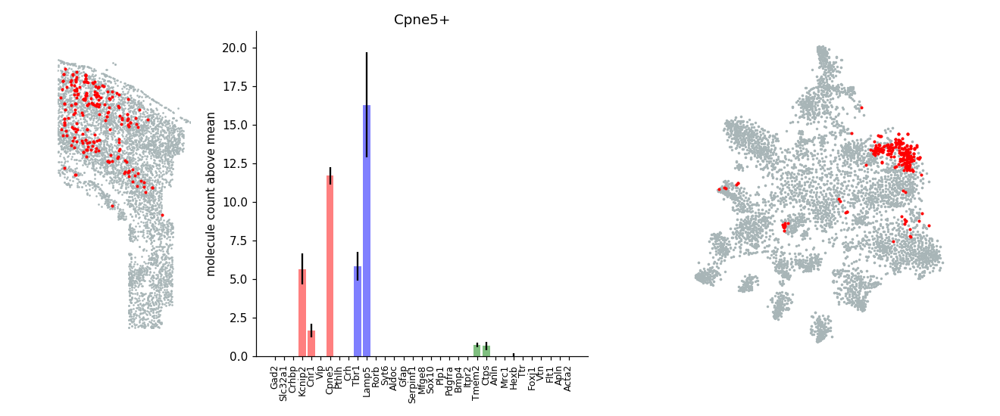

<IPython.core.display.Javascript object>


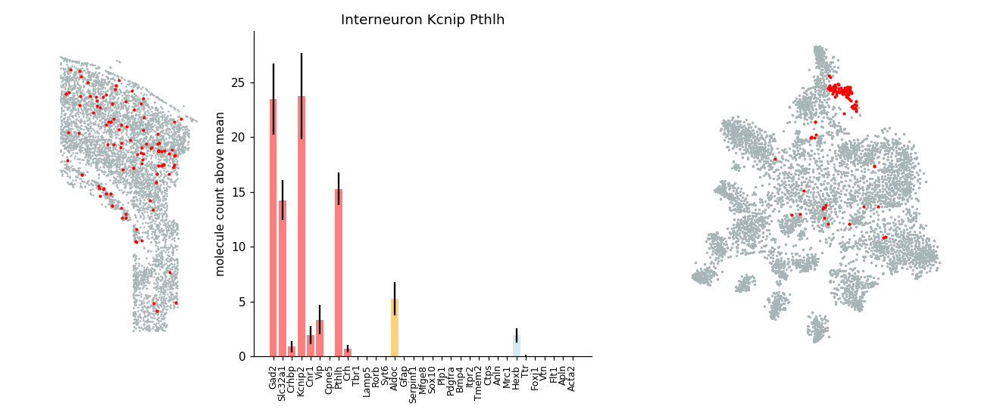

<IPython.core.display.Javascript object>


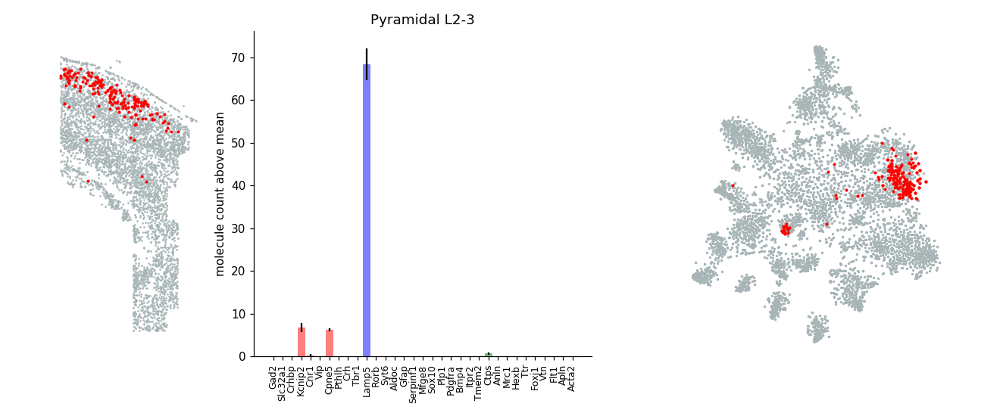

<IPython.core.display.Javascript object>


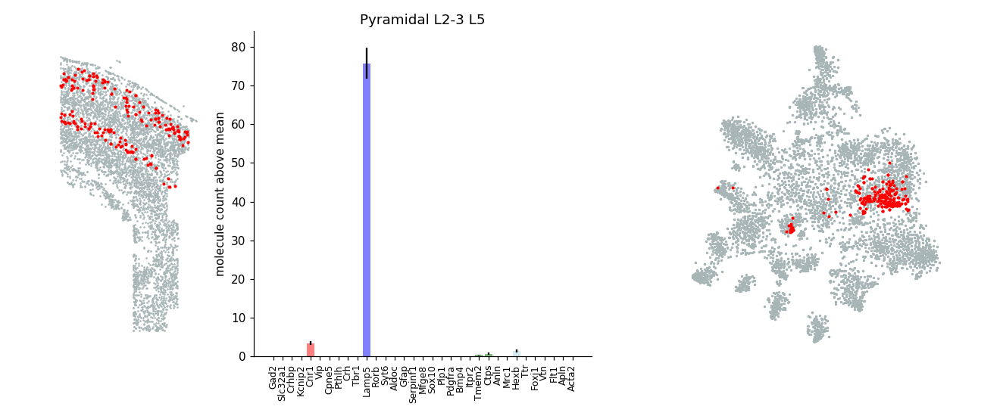

<IPython.core.display.Javascript object>


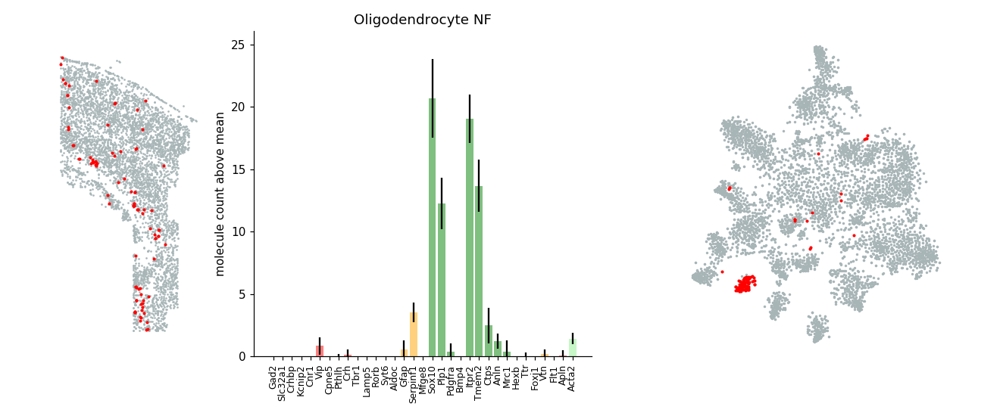

<IPython.core.display.Javascript object>


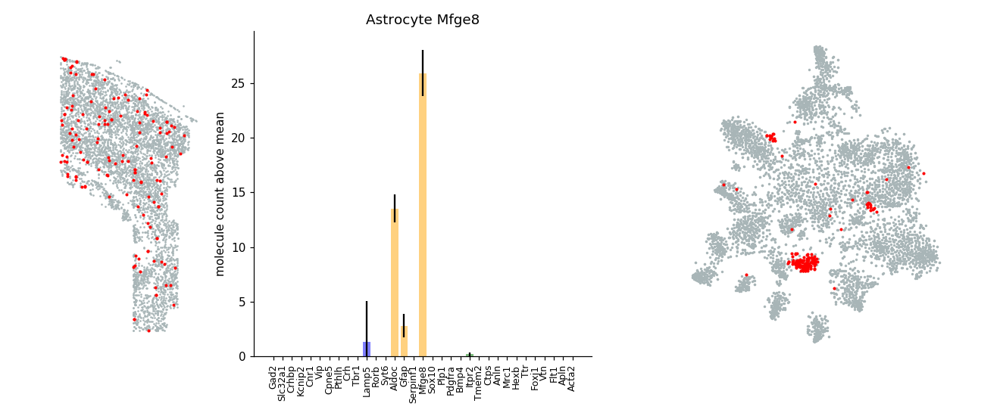

<IPython.core.display.Javascript object>


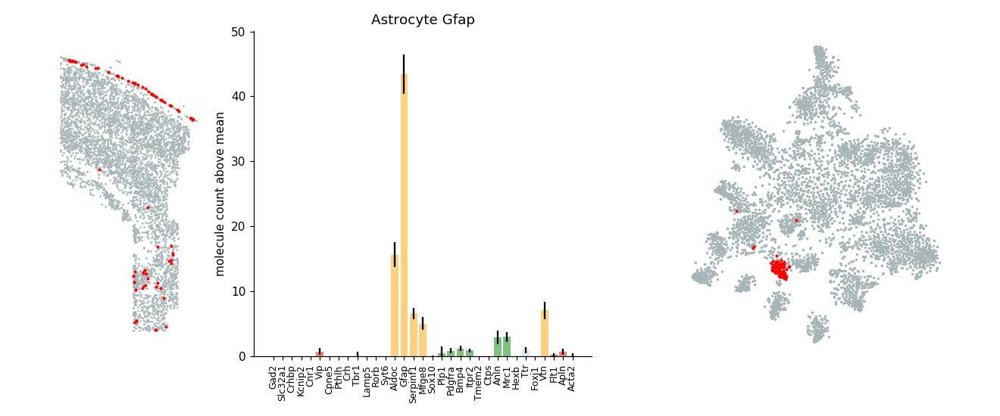

<IPython.core.display.Javascript object>


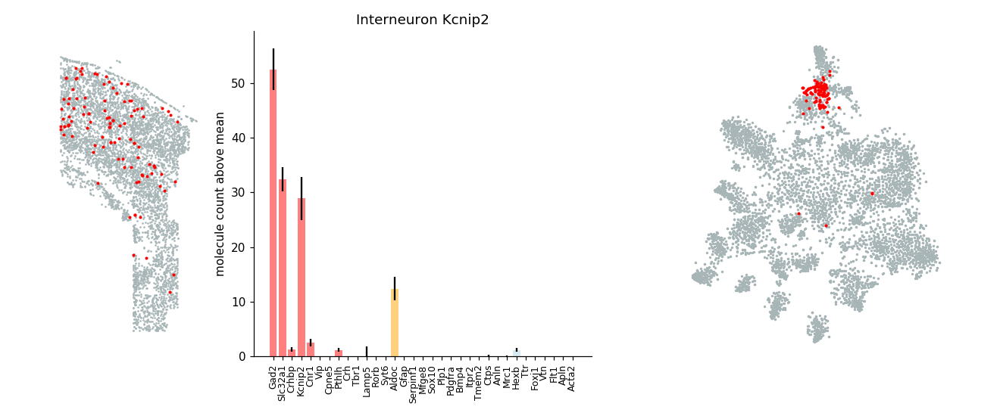

<IPython.core.display.Javascript object>


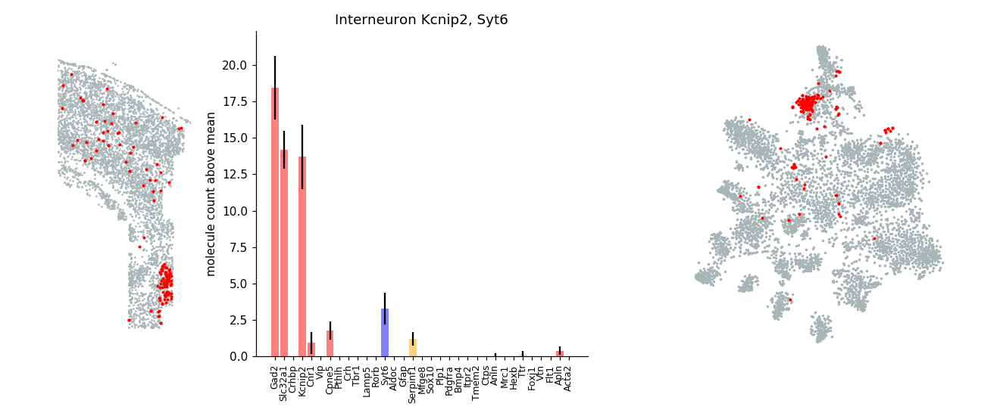

<IPython.core.display.Javascript object>


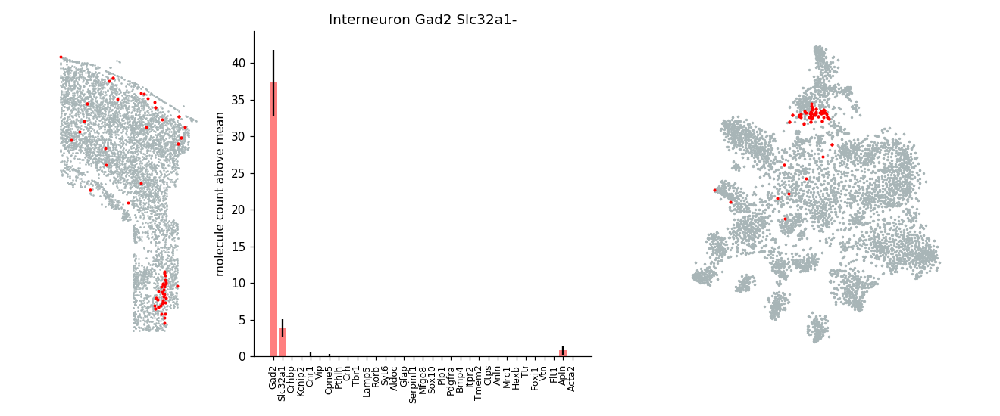

<IPython.core.display.Javascript object>


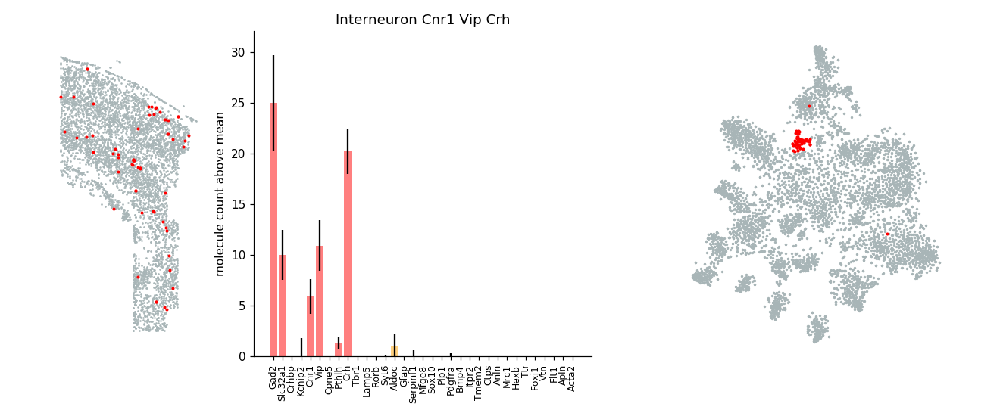

<IPython.core.display.Javascript object>


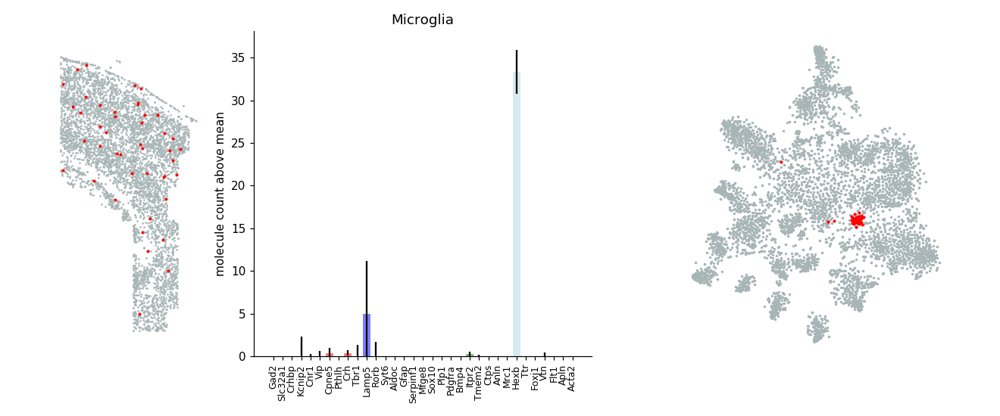

<IPython.core.display.Javascript object>


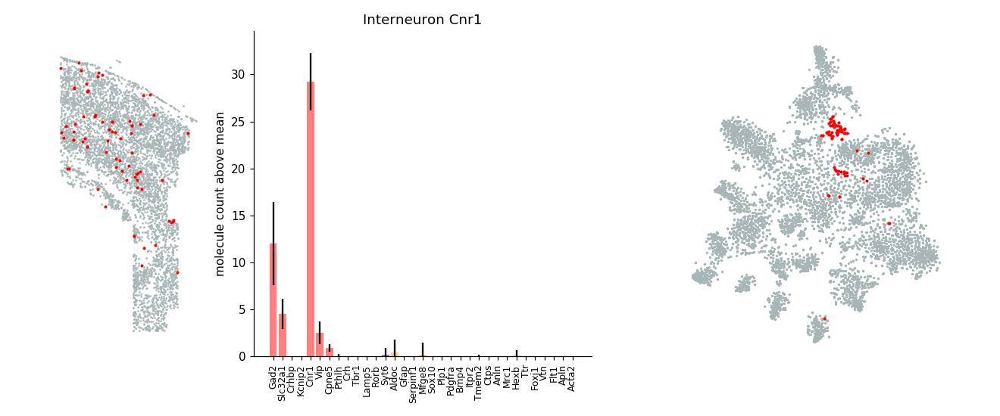

<IPython.core.display.Javascript object>


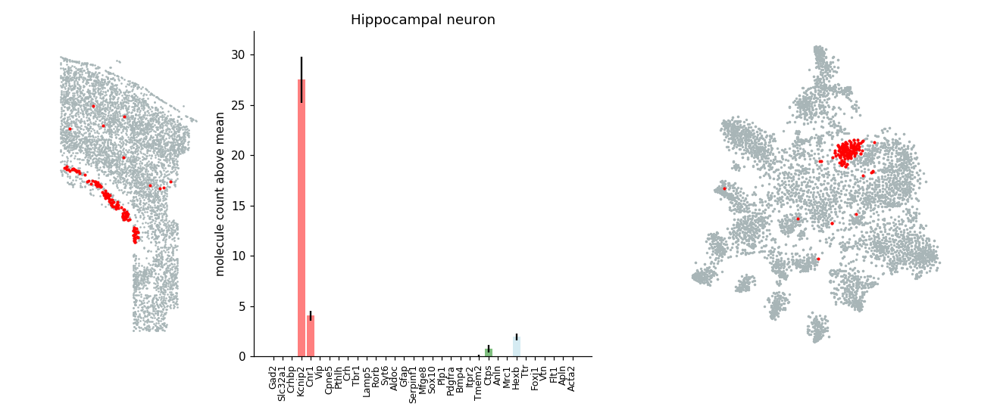

<IPython.core.display.Javascript object>


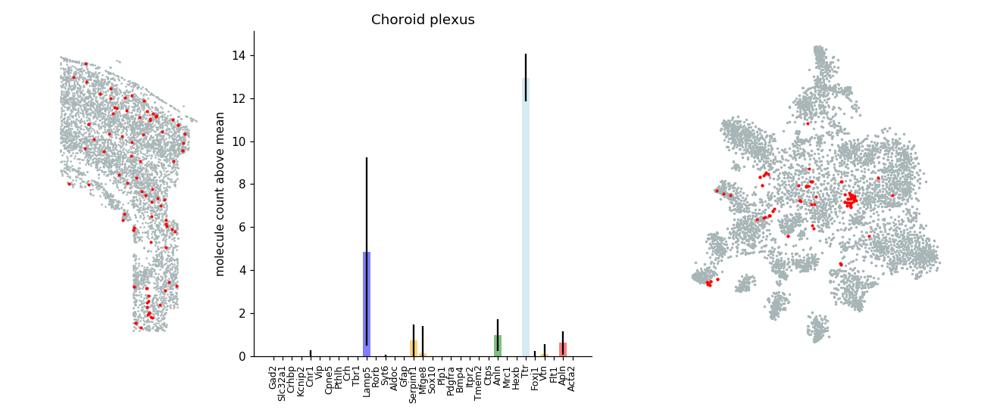

<IPython.core.display.Javascript object>


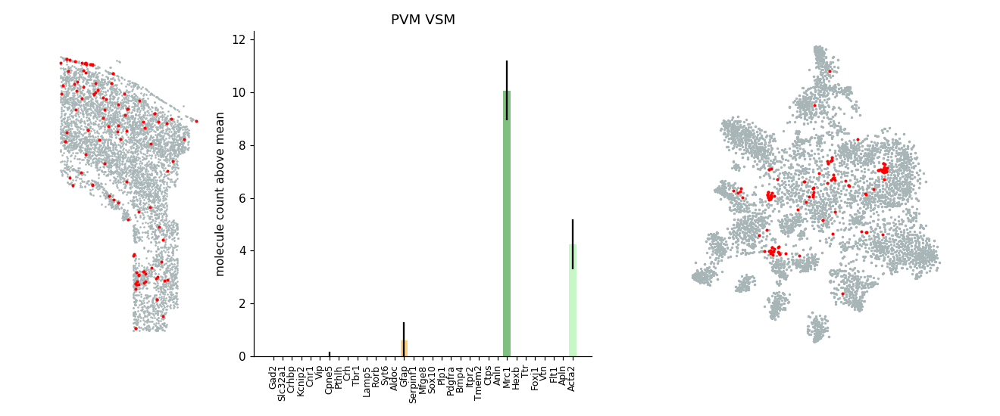

<IPython.core.display.Javascript object>


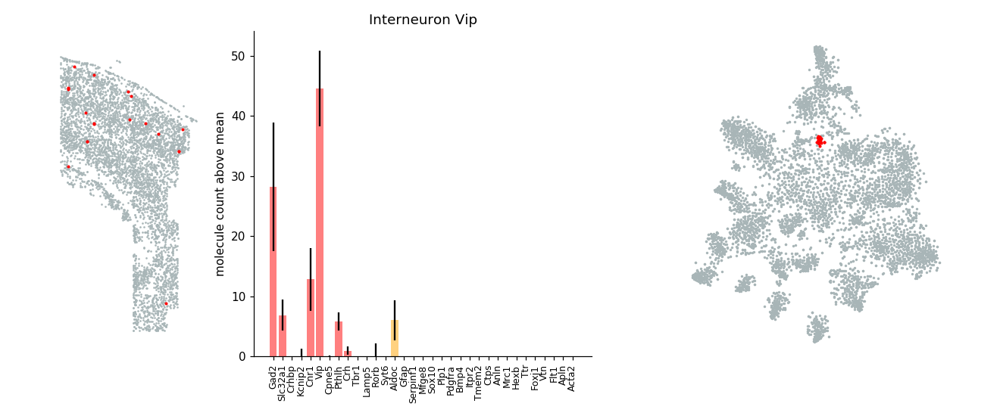

<IPython.core.display.Javascript object>


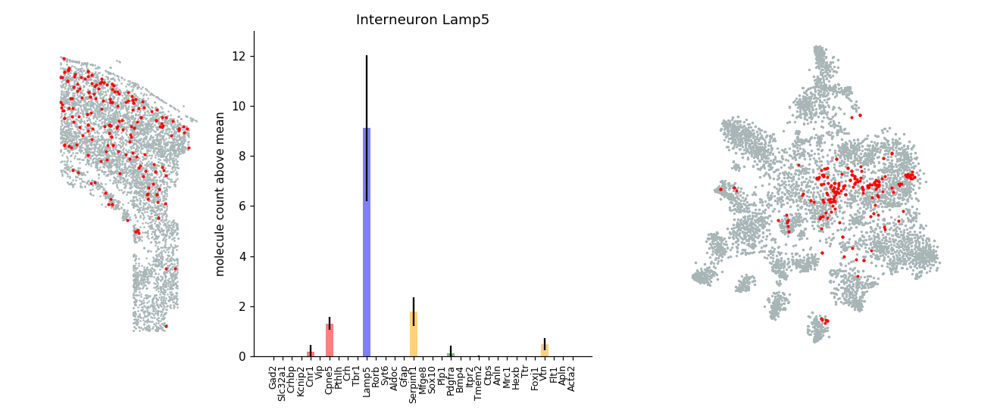

<IPython.core.display.Javascript object>


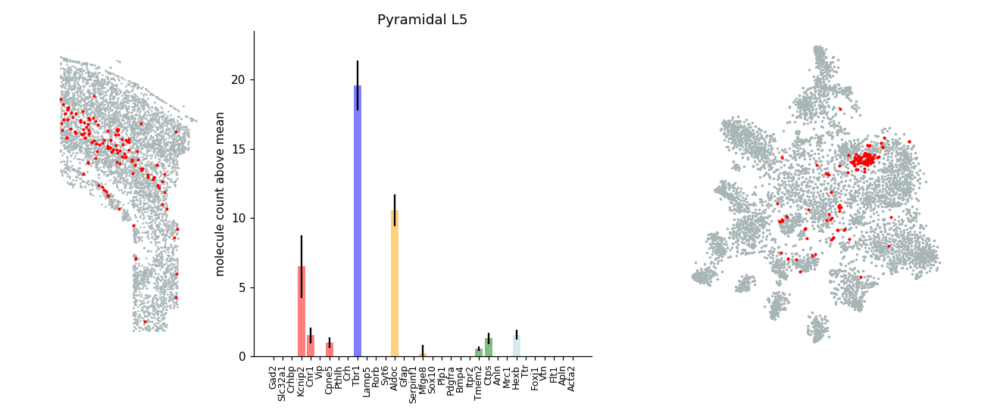

<IPython.core.display.Javascript object>


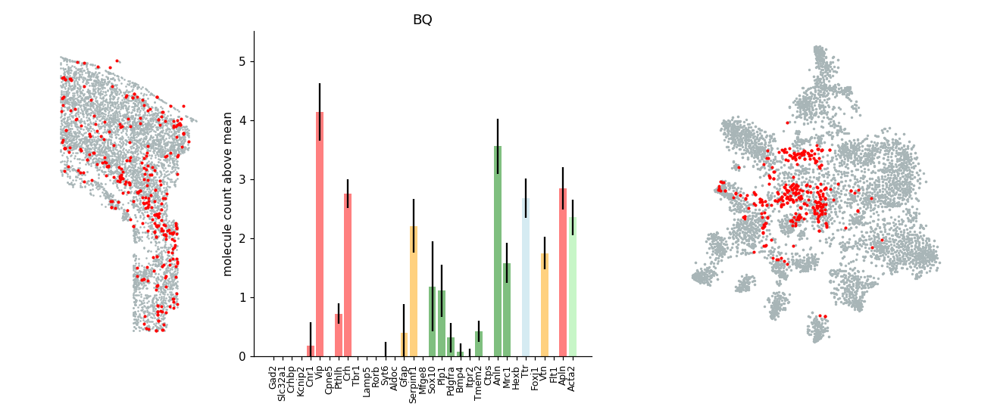

<IPython.core.display.Javascript object>


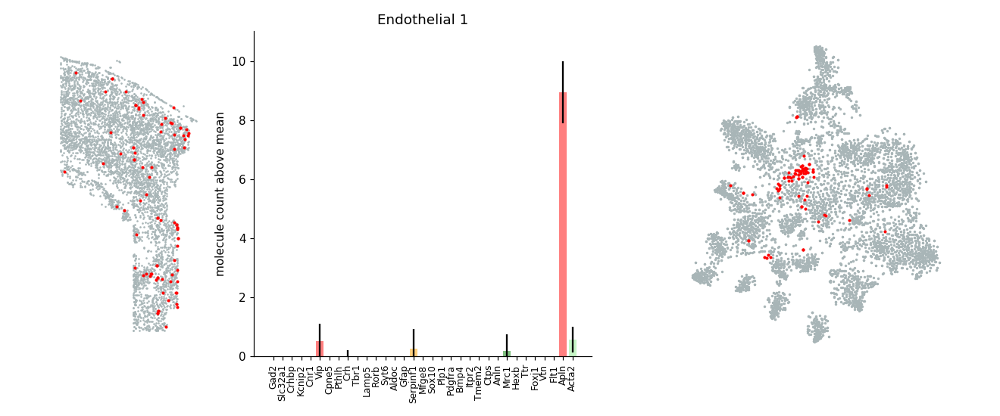

<IPython.core.display.Javascript object>


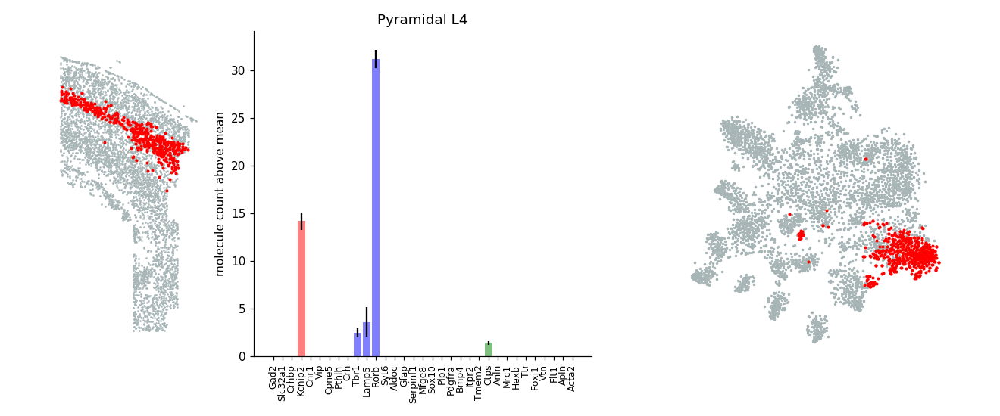

<IPython.core.display.Javascript object>


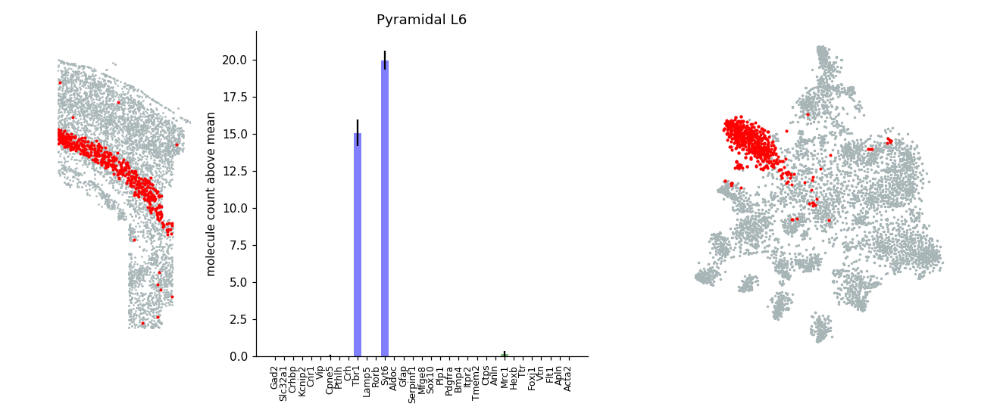

<IPython.core.display.Javascript object>


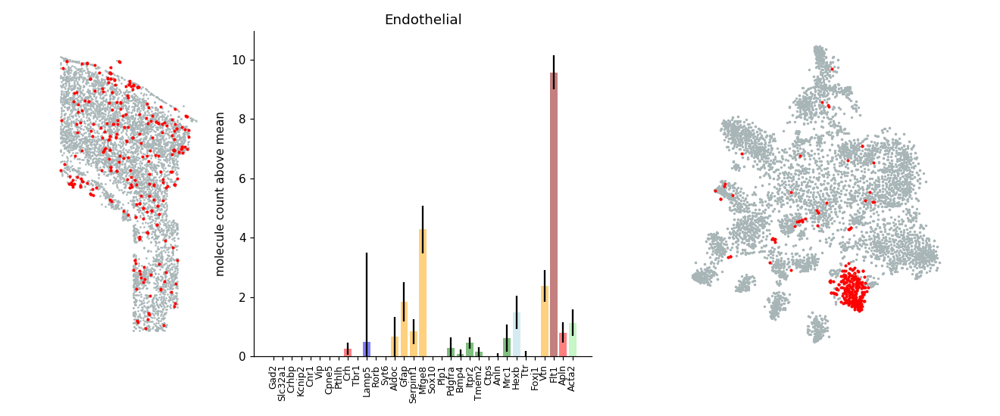

<IPython.core.display.Javascript object>


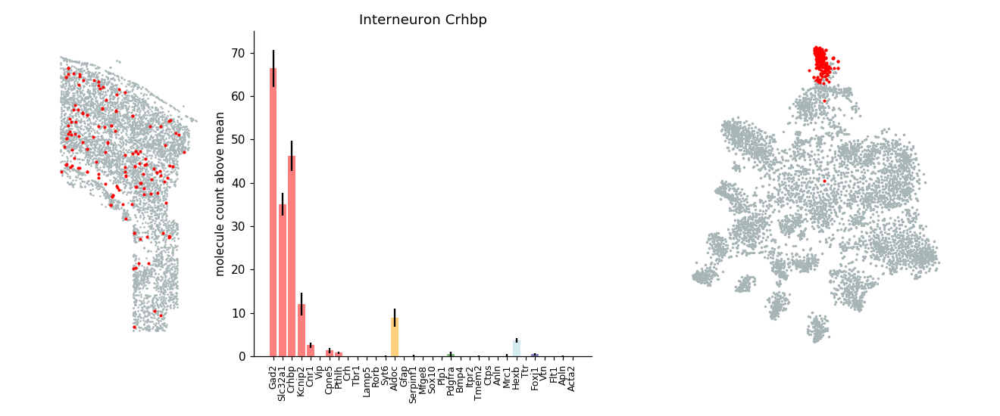

<IPython.core.display.Javascript object>


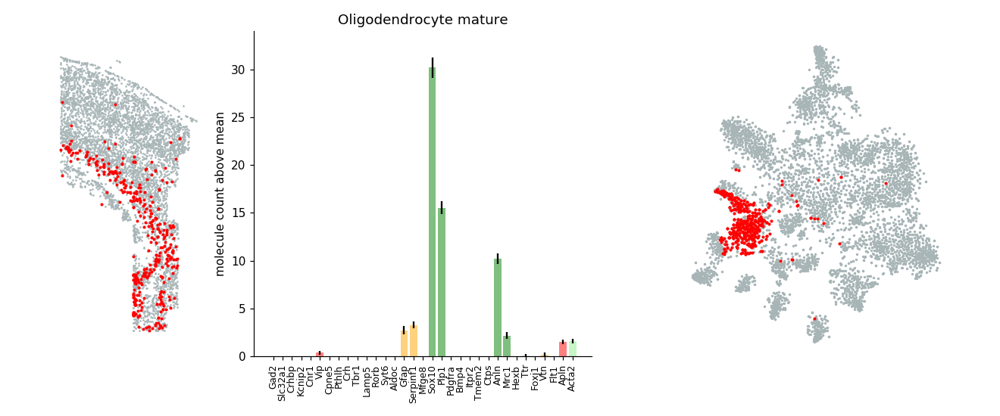

In [1018]:
for i in np.unique(labels): 
    fig = plt.figure(figsize=(12,5))
    
    ax1 = plt.subplot2grid((1,5), (0,0), rowspan=1, colspan=1)
    ax1.scatter(coord_df.loc['X',:], coord_df.loc['Y',:], linewidths=0, c=[168/255, 181/255, 183/255],  s=3)
    filt = labels_a == i
    ax1.scatter(coord_df.loc['X',filt], coord_df.loc['Y',filt], linewidths=0, c='red', s=7)
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_axis_off()
    ax1.axis('equal')
    ax1.set_xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
    ax1.set_ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])
    
    data = df_fish.loc[:,filt]
    gene_colors = ['red', 'red', 'red', 'red', 'red', 'red', 'red', 'red', 'red','blue', 'blue', 'blue', 'blue','orange', 'orange', 'orange', 'orange',
        'green', 'green', 'green', 'green', 'green',  'green', 'green', 'green', 'green',
        'lightblue', 'lightblue', 'darkblue', 'orange','darkred','red','lightgreen','red']
    left_pos = range(data.shape[0])
    
    ax2 = plt.subplot2grid((1,5), (0,1), rowspan=1, colspan=2)
    exp_to_plot = (data.mean(axis=1) - df_fish.mean(axis=1))
    ax2.bar(left_pos, exp_to_plot, color=gene_colors, alpha=0.5, yerr=data.sem(axis=1)) 
    x_lab = [i.split('_')[1] for i in list(df_fish_totmol.index)]
    ax2.set_xticks(left_pos)
    ax2.set_xticklabels(x_lab, rotation='vertical', fontsize=8)
    ax2.set_ylim(0)
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.yaxis.set_ticks_position('left')
    ax2.xaxis.set_ticks_position('bottom')
    ax2.set_ylabel('molecule count above mean')
    plt.title(cluster_names[i])
    
    ax3 = plt.subplot2grid((1,5), (0,3), rowspan=1, colspan=2)
    ax3.scatter(tSNE_points[:,0], tSNE_points[:,1], c=[168/255, 181/255, 183/255], lw=0, s=5)
    points_of_cluster = tSNE_points[labels_a == i]
    plt.scatter(points_of_cluster[:,0], points_of_cluster[:,1],c='red', lw=0, alpha=1, s=7)
    ax3.set_axis_off()
    ax3.axis('equal')
    
    plt.tight_layout()
    plt.savefig('Clusters/{}_{}.png'.format(i, cluster_names[i]), dpi=300)

In [883]:
data.sem(axis=1)

Hybridization2_Gad2        0.667595
Hybridization12_Slc32a1    0.257103
Hybridization10_Crhbp      0.114940
Hybridization12_Kcnip2     0.996034
Hybridization13_Cnr1       0.319653
Hybridization6_Vip         0.232921
Hybridization5_Cpne5       0.263696
Hybridization8_Pthlh       0.093609
Hybridization10_Crh        0.168381
Hybridization1_Tbr1        0.858838
Hybridization9_Lamp5       3.418084
Hybridization7_Rorb        0.614797
Hybridization11_Syt6       0.414742
Hybridization1_Aldoc       0.724356
Hybridization2_Gfap        0.681441
Hybridization8_Serpinf1    0.439523
Hybridization3_Mfge8       0.932194
Hybridization7_Sox10       0.685095
Hybridization13_Plp1       0.370668
Hybridization8_Pdgfra      0.417944
Hybridization6_Bmp4        0.107170
Hybridization6_Itpr2       0.118929
Hybridization11_Tmem2      0.112032
Hybridization7_Ctps        0.304346
Hybridization5_Klk6        0.017014
Hybridization9_Anln        0.297178
Hybridization3_Mrc1        0.500574
Hybridization3_Hexb        0

In [845]:
qq[w]

array([[3, 4]])